In [ ]:
!pip install gradio fastbook ddgs wget

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 92.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.9 MB/s eta 0:00:00
  

In [ ]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [ ]:
from ddgs import DDGS
from fastcore.all import *
import os

def search_images(keywords, max_images=200): return L(DDGS().images(query=keywords, num_results=max_images)).itemgot('image')

In [ ]:
from fastdownload import download_url
from PIL import Image
from fastai.vision.all import *

path = Path('gdrive/MyDrive/muffin_or_chi')

search_terms = {
    'muffin': [
        'blueberry muffin',
        'muffin',
        'chocolate chip muffin',
        'chocolate muffin',
        'raisin muffins',
        'muffin close-up',
        'bakery muffin',
        'fresh muffin',
        'muffins',
        'bran muffin',
        'muffin on plate',
        'sliced muffin'
    ],
    'chihuahua': [
      'chihuahua',
      'chihuahua apple head',
      'chihuahua deer head',
      'chihuahua long coat',
      'chihuahua short coat',
      'chihuahua puppy',
      'teacup chihuahua',
      'red chihuahua',
      'fawn chihuahua',
      'chocolate chihuahua',
      'cream chihuahua',
      'red white chihuahua',
      'gold white chihuahua',
      'chihuahua head'
    ]
}

for o in search_terms.keys():
    dest = (path/o)
    dest.mkdir(exist_ok=True, parents=True)

    queries = search_terms[o]
    for q in queries:
      u = search_images(f'{q} photo')
      print(q, len(u))
      download_images(dest, urls=u)

    resize_images(path=dest, max_size=400, dest=dest)

blueberry muffin 10
muffin 10
chocolate chip muffin 10
chocolate muffin 10
raisin muffins 10
muffin close-up 10
bakery muffin 10
fresh muffin 10
muffins 10
bran muffin 10
muffin on plate 10
sliced muffin 10
chihuahua 10
chihuahua apple head 10
chihuahua deer head 10
chihuahua long coat 10
chihuahua short coat 10
chihuahua puppy 10
teacup chihuahua 10
red chihuahua 10
fawn chihuahua 10
chocolate chihuahua 10
cream chihuahua 10
red white chihuahua 10
gold white chihuahua 10


In [ ]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

14

In [ ]:
dls = DataBlock(
       blocks=(ImageBlock, CategoryBlock),
       get_items=get_image_files,
       splitter=RandomSplitter(valid_pct=0.2, seed=42),
       get_y=parent_label,
       item_tfms=RandomResizedCrop(224, min_scale=0.5),
       batch_tfms=aug_transforms()
      ).dataloaders(path, bs=32)

(216, 54)

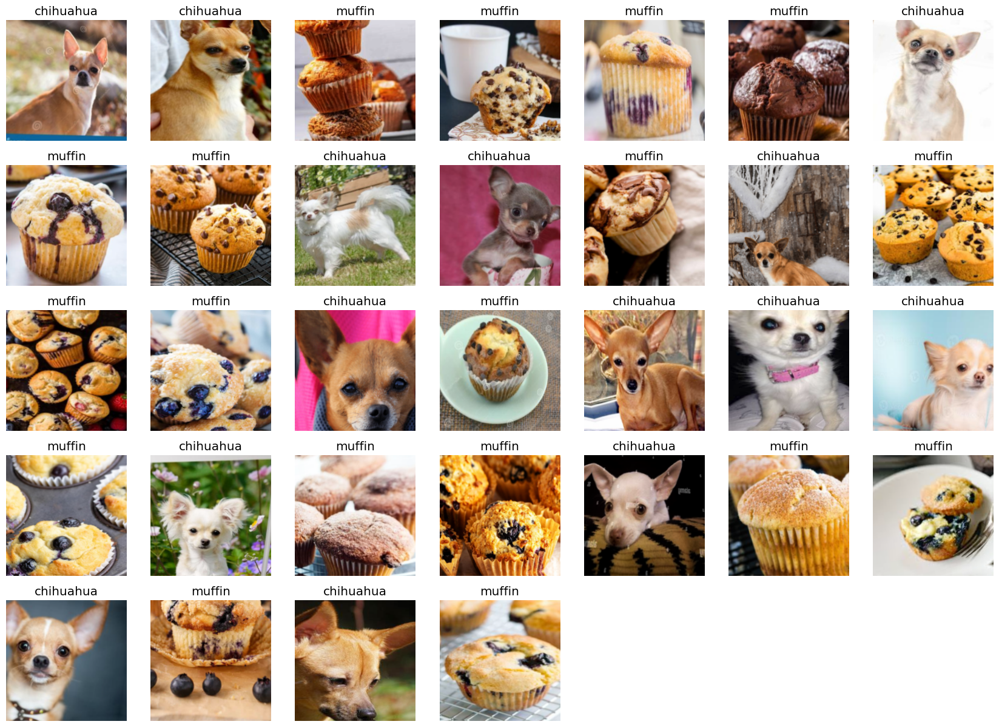

In [ ]:
dls.show_batch(max_n=100)
len(dls.train_ds), len(dls.valid_ds)

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(3)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 67.2MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,0.536775,0.005933,0.000000,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.018113,0.000108,0.000000,00:03
1,0.008968,0.000032,0.000000,00:02
2,0.008318,0.000040,0.000000,00:02


In [ ]:
from fastai.vision.widgets import ImageClassifierCleaner

cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
c,_,probs = learn.predict(PILImage.create('gdrive/MyDrive/muffin_or_chi/sample-1.jpg'))
print(f"This is a: {c}.")
print(f"Probability it's a chihuahua: {probs[0]:.4f}")

This is a: chihuahua.
Probability it's a chihuahua: 0.9999


In [ ]:
learn.export()